**ACHRAF JARRAR**


In our group project, we are developing a platformer video game that blends reality with the virtual world. The gameplay involves capturing photos of birds in real life, which are then scored based on the rarity of the bird species identified in the images.

My part consists on developping a model that receives an image, preprocesses it and then predicts which bird is in the picture.

Another part consists of augmenting the dataset by including more classes, and adding images of different qualities to the current classes.

This part was not included in the notebook.

 I utilized the InceptionV3 model as the base architecture. This pre-trained model provides a strong foundation for our task due to its advanced feature extraction capabilities.

The dataset of birds can be found in Kaggle. It contains 525 classes.

In [3]:
import tensorflow as tf
import os
import numpy as np
import requests
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
from google.colab.patches import cv2_imshow # cuz colab do not support cv2.imshow()
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Flatten,Dense,Activation
from tensorflow.keras.models import Model
from keras.applications.imagenet_utils import decode_predictions
from keras.applications.inception_v3 import preprocess_input
import tensorflow as tf
from keras.preprocessing import image

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
Path_train = "/content/drive/MyDrive/PACT/train"
Path_validate = "/content/drive/MyDrive/PACT/valid"
Path_test =  "/content/drive/MyDrive/PACT/test"
categories = [x for x in os.listdir(Path_train)]
categories.sort()
print(categories[:10])

['ABBOTTS BABBLER', 'ABBOTTS BOOBY', 'ABYSSINIAN GROUND HORNBILL', 'AFRICAN CROWNED CRANE', 'AFRICAN EMERALD CUCKOO', 'AFRICAN FIREFINCH', 'AFRICAN OYSTER CATCHER', 'AFRICAN PIED HORNBILL', 'AFRICAN PYGMY GOOSE', 'ALBATROSS']


In [ ]:
# Training dataframe
df_train = pd.DataFrame(columns=["filename","category"])
for c in categories:

  sub_paths = [c+"/"+x for x in os.listdir(Path_train+"/"+c)]  # subpath to bird specie individuals

  value = [c for x in range(len(sub_paths))]  # all same specie

  if len(value) == 1:

    sub_paths = [sub_paths[0]+"/"+x for x in os.listdir(Path_train+"/"+sub_paths[0])]
    value = [c for x in range(len(sub_paths))]  # all same specie

  #print(len(sub_paths)

  new_df = pd.DataFrame({"filename":sub_paths,"category":value})
  df_train = pd.concat([df_train,new_df],ignore_index=True)

df_train

,filename,category
0,ABBOTTS BABBLER/029.jpg,ABBOTTS BABBLER
1,ABBOTTS BABBLER/014.jpg,ABBOTTS BABBLER
2,ABBOTTS BABBLER/150.jpg,ABBOTTS BABBLER
3,ABBOTTS BABBLER/109.jpg,ABBOTTS BABBLER
4,ABBOTTS BABBLER/034.jpg,ABBOTTS BABBLER
...,...,...
84630,ZEBRA DOVE/134.jpg,ZEBRA DOVE
84631,ZEBRA DOVE/136.jpg,ZEBRA DOVE
84632,ZEBRA DOVE/90.jpg,ZEBRA DOVE
84633,ZEBRA DOVE/25.jpg,ZEBRA DOVE


In [ ]:
# Validation data frame
categories = [x for x in os.listdir(Path_validate)]

df_validate = pd.DataFrame(columns=["filename","category"])

for c in categories:

  sub_paths = [c+"/"+x for x in os.listdir(Path_validate+"/"+c)]
  value = [c for x in range(len(sub_paths))]

  if len(value) == 1:

    sub_paths = [sub_paths[0]+"/"+x for x in os.listdir(Path_validate+"/"+sub_paths[0])]
    value = [c for x in range(len(sub_paths))]  # all same specie

  new_df = pd.DataFrame({"filename":sub_paths,"category":value})
  df_validate = pd.concat([df_validate,new_df],ignore_index=True)

df_validate

,filename,category
0,DALMATIAN PELICAN/5.jpg,DALMATIAN PELICAN
1,DALMATIAN PELICAN/1.jpg,DALMATIAN PELICAN
2,DALMATIAN PELICAN/4.jpg,DALMATIAN PELICAN
3,DALMATIAN PELICAN/3.jpg,DALMATIAN PELICAN
4,DALMATIAN PELICAN/2.jpg,DALMATIAN PELICAN
...,...,...
2620,GOLDEN EAGLE/5.jpg,GOLDEN EAGLE
2621,GOLDEN EAGLE/1.jpg,GOLDEN EAGLE
2622,GOLDEN EAGLE/4.jpg,GOLDEN EAGLE
2623,GOLDEN EAGLE/3.jpg,GOLDEN EAGLE


In [ ]:
#Test data frame
categories = [x for x in os.listdir(Path_test)]

df_test = pd.DataFrame(columns=["filename","category"])

for c in categories:

  sub_paths = [c+"/"+x for x in os.listdir(Path_test+"/"+c)]
  value = [c for x in range(len(sub_paths))]

  if len(value) == 1:

    sub_paths = [sub_paths[0]+"/"+x for x in os.listdir(Path_test+"/"+sub_paths[0])]
    value = [c for x in range(len(sub_paths))]  # all same specie

  new_df = pd.DataFrame({"filename":sub_paths,"category":value})
  df_test = pd.concat([df_test,new_df],ignore_index=True)

df_test

,filename,category
0,DALMATIAN PELICAN/5.jpg,DALMATIAN PELICAN
1,DALMATIAN PELICAN/1.jpg,DALMATIAN PELICAN
2,DALMATIAN PELICAN/4.jpg,DALMATIAN PELICAN
3,DALMATIAN PELICAN/3.jpg,DALMATIAN PELICAN
4,DALMATIAN PELICAN/2.jpg,DALMATIAN PELICAN
...,...,...
2620,GOLDEN EAGLE/5.jpg,GOLDEN EAGLE
2621,GOLDEN EAGLE/1.jpg,GOLDEN EAGLE
2622,GOLDEN EAGLE/4.jpg,GOLDEN EAGLE
2623,GOLDEN EAGLE/3.jpg,GOLDEN EAGLE


In [52]:
size = 224
nb_classes = len(categories)
inception = InceptionV3(include_top =False ,input_shape=(size,size,3),weights='imagenet')  # (width, height, nb of color channels) avant 256.
for layer in inception.layers:
  layer.trainable = False

x=Flatten()(inception.output)
x=Dense(units=1024,activation='relu')(x)
x=Dense(nb_classes)(x)
out=Activation(activation='softmax')(x)
model = Model(inputs=inception.input,outputs=out)

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss=tf.keras.losses.categorical_crossentropy,metrics=['accuracy'])
model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 74,770,733 (285.23 MB)

 Trainable params: 52,967,949 (202.06 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
train_datagen = ImageDataGenerator(rotation_range=15,
                                   rescale=1./255,
                                   shear_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1)

train_generator = train_datagen.flow_from_dataframe(df_train,
                                                    Path_train,
                                                    x_col="filename",
                                                    y_col="category",
                                                    target_size=(size,size),
                                                    class_mode='categorical',
                                                    batch_size=32)

Found 84635 validated image filenames belonging to 525 classes.


In [ ]:
validate_datagen = ImageDataGenerator(rescale=1./255)

validate_generator = validate_datagen.flow_from_dataframe(df_validate,
                                                          Path_validate,
                                                          x_col="filename",
                                                          y_col="category",
                                                          target_size=(size, size),
                                                          class_mode='categorical',
                                                          batch_size=32)

Found 2625 validated image filenames belonging to 525 classes.


In [ ]:
test_gen = ImageDataGenerator(rescale =1./255)
test_set = test_gen.flow_from_dataframe(df_test,
                                        Path_test,
                                        x_col = "filename",
                                        y_col = "category",
                                        target_size = (size, size),
                                        class_mode = 'categorical',
                                        batch_size = 32)

Found 2625 validated image filenames belonging to 525 classes.


In [ ]:
batch_size = 32
epoch = 30
history = model.fit(train_generator,
                    epochs=epoch,
                    validation_data=validate_generator)

Epoch 1/30
2645/2645 [==============================] - 2239s 0ms/step - loss: 5.9587 - accuracy: 0.2047 - val_loss: 4.4047 - val_accuracy: 0.4400
Epoch 2/30
2645/2645 [==============================] - 1807s 0ms/step - loss: 4.4957 - accuracy: 0.3238 - val_loss: 3.0230 - val_accuracy: 0.5373
Epoch 3/30
2645/2645 [==============================] - 1854s 0ms/step - loss: 3.6541 - accuracy: 0.5329 - val_loss: 2.6282 - val_accuracy: 0.7272
Epoch 4/30
2645/2645 [==============================] - 1847s 0ms/step - loss: 3.2741 - accuracy: 0.6524 - val_loss: 1.8676 - val_accuracy: 0.7978
Epoch 5/30
2645/2645 [==============================] - 1462s 0ms/step - loss: 2.4533 - accuracy: 0.7146 - val_loss: 1.5221 - val_accuracy: 0.8057
Epoch 6/30
2645/2645 [==============================] - 1461s 0ms/step - loss: 2.3051 - accuracy: 0.7329 - val_loss: 1.1873 - val_accuracy: 0.8176
Epoch 7/30
2645/2645 [==============================] - 1391s 0ms/step - loss: 1.8462 - accuracy: 0.7541 - val_loss: 1

In [ ]:
losses = history['loss']
val_losses = history['val_loss']
accuracies = history['accuracy']
val_accuracies = history['val_accuracy']

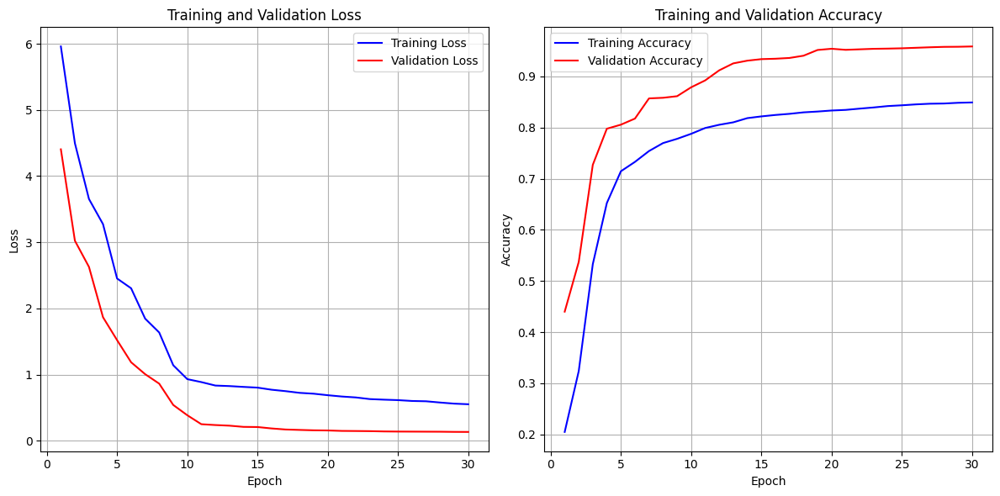

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), losses, label='Training Loss', color='blue')
plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), accuracies, label='Training Accuracy', color='blue')
plt.plot(range(1, epochs + 1), val_accuracies, label='Validation Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
model.evaluate(df_test)

83/83 [==============================] - 31s 380ms/step - loss: 0.2073 - accuracy: 0.9464


2) Preprocessing part : Using YOLO to capture birds in images

This function get a path to an image in my drive and do the following :
* Detect all birds in the image.
* If no bird was detected ( The confidence is inferior to 0.3) return the message " The Input picture is not a bird " .
* If there are many birds or just one it only takes the bird the most apparent.
* Resize the output picture for using it in our model.

In [48]:
def focus_main_bird(path_to_image) :
    ROOT_COLAB = '/content/drive/MyDrive/Detect/YOLODATA/'
    COCO_LABELS_FILE = ROOT_COLAB + 'coco.names'
    YOLO_CONFIG_FILE = ROOT_COLAB + 'yolov3.cfg'
    YOLO_WEIGHTS_FILE = ROOT_COLAB + 'yolov3.weights'
    yolo = cv2.dnn.readNetFromDarknet(YOLO_CONFIG_FILE, YOLO_WEIGHTS_FILE)

    # Setting up input and output layers
    layer_names = yolo.getLayerNames()
    output_layers = [layer_names[i- 1] for i in yolo.getUnconnectedOutLayers()]

    # Loading image
    img = cv2.imread(path_to_image)
    img2 = img.copy()

    # Resizing image
    img = cv2.resize(img, (640, 480))
    img2 = cv2.resize(img2, (640, 480))

    # Detecting objects in the image
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    yolo.setInput(blob)
    outs = yolo.forward(output_layers)

    # Setting up variables for tracking
    boxes = []
    confidences = []
    class_ids = []

    # Loop for detecting objects
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3 and (class_id == 14) :
                center_x = int(detection[0] * 640)
                center_y = int(detection[1] * 480)
                w = int(detection[2] * 640)
                h = int(detection[3] * 480)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    if len(confidences) == 0 :

      return "The Input picture is not a bird!"

    # Non-maximum suppression for removing redundant boxes
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.3, 0.4)

    # Loop for drawing boxes around objects
    rect_img = img2
    max = 0
    for i in indexes:
      x, y, w, h = boxes[i]

      if x <0:
        x= 0
      if y <0:
        y= 0
      cv2.rectangle(img, (x, y), (x + w, y + h), [255 ,0 ,0], 2)
      if (w*h) > max :
        max = w*h
        rect_img = img2[y:y+h , x:x+w]
      r = cv2.resize(rect_img, (224, 224))

    return r

In [45]:
image1 =  "/content/drive/MyDrive/Bird.jpg"
image2 = "/content/drive/MyDrive/Bird2.jpg"
image3 = "/content/drive/MyDrive/Face.jpg"

### 1st Goal : To localize the bird and crop the unnecessary space

Original Image : One Bird 


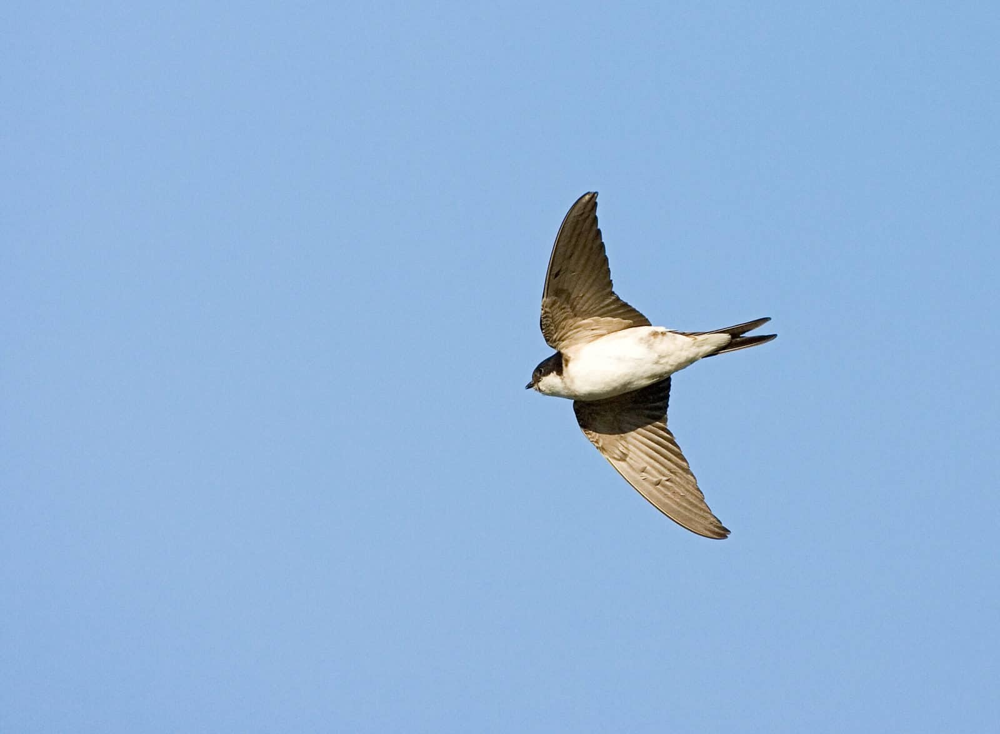

In [46]:
print("Original Image : One Bird ")
img = cv2.imread(image1)
cv2_imshow(img)

Output picture : One Bird 


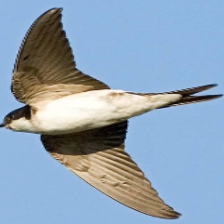

In [49]:
print("Output picture : One Bird ")
cv2_imshow(focus_main_bird(image1))

Original Image : Many Birds 


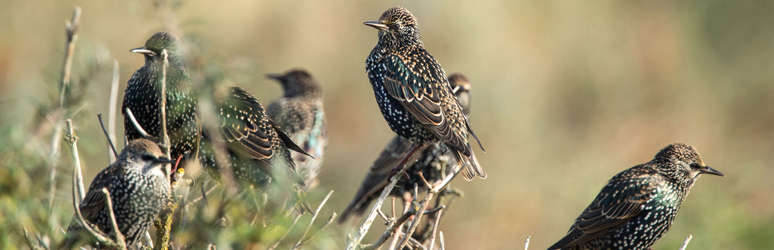

In [36]:
print("Original Image : Many Birds ")
img = cv2.imread(image2)
cv2_imshow(img)

Output picture : Many Birds 


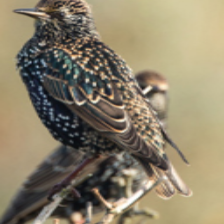

In [37]:
print("Output picture : Many Birds ")
cv2_imshow(focus_main_bird(image2))

Original Image : No Bird 


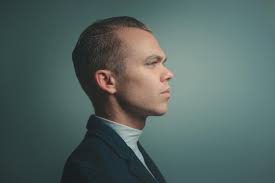

In [38]:
print("Original Image : No Bird ")
img = cv2.imread(image3)
cv2_imshow(img)

In [50]:
print("Output: No Bird ")
focus_main_bird(image3)

Output: No Bird 


'The Input picture is not a bird!'

In [69]:
crow_image = "/content/drive/MyDrive/crow.jpg"
turkey_image ="/content/drive/MyDrive/turkey.jpg"

In [65]:
def pipeline(img_path):
  print("Input Image : ")
  # Load the image
  image_test = cv2.imread(img_path)
  cv2_imshow(image_test)
  # Preprocess the image
  img = focus_main_bird(img_path)
  # Convert the image to array
  img_array = img_to_array(img)  # Convert image to array
  img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
  img_array = img_array / 255.0  # Normalize pixel values
  # Make prediction
  predictions = model.predict(img_array)
  # Get the predicted class index
  predicted_class_index = np.argmax(predictions, axis=1)[0]
  # Retrieve the class name
  predicted_class_name = categories[predicted_class_index]
  print("The Predicted Class : ",predicted_class_name)
  return predicted_class_name

Input Image : 


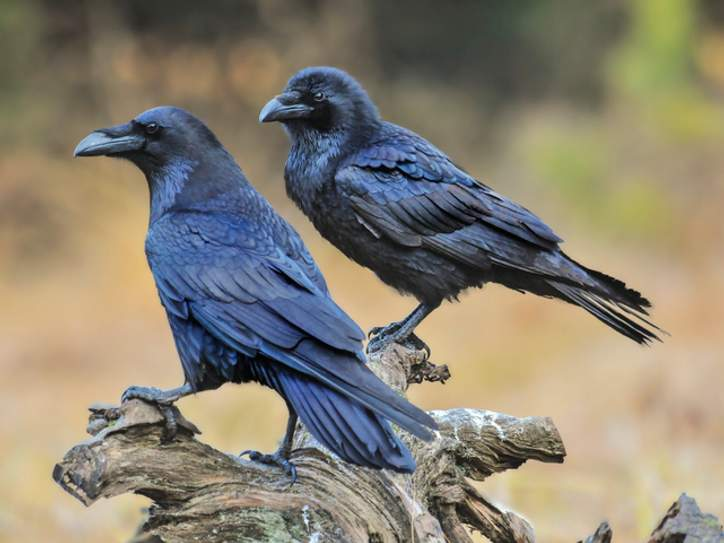

1/1 [==============================] - 0s 29ms/step
The Predicted Class : CROW


In [68]:
pipeline(crow_image)

Input Image : 


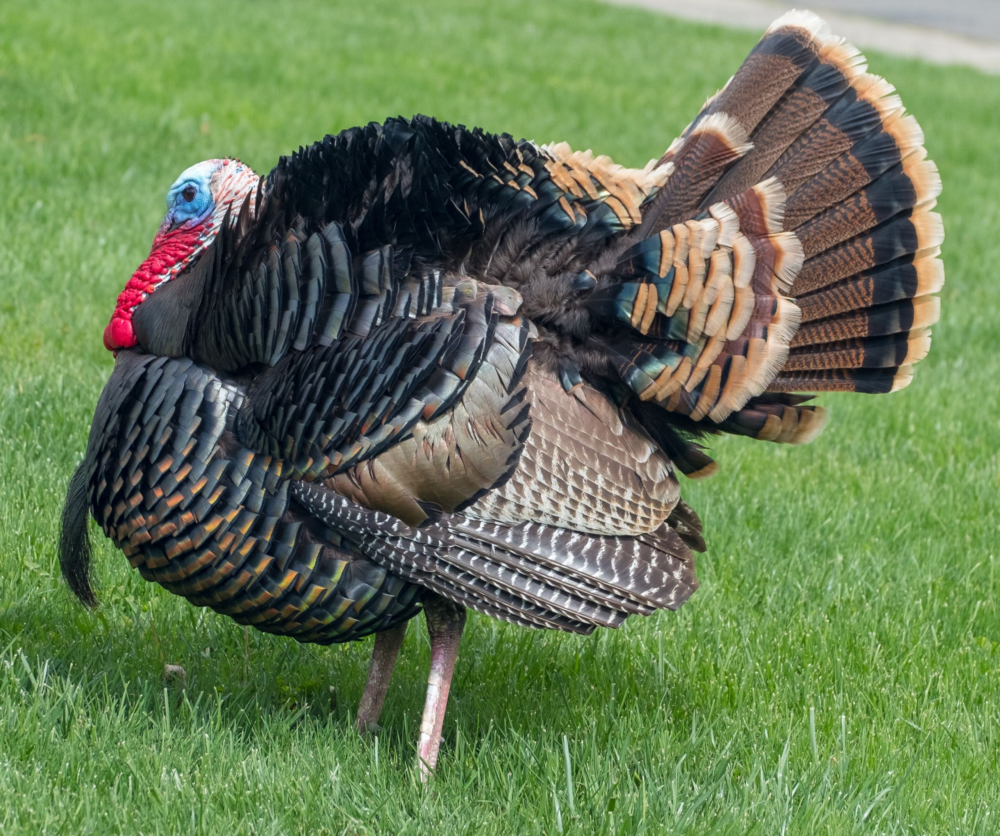

1/1 [==============================] - 0s 27ms/step
The Predicted Class : WILD TURKEY


In [71]:
pipeline(turkey_image)